# Calculate snow depth using the SA technique for simulated ICESat-2 data:  
### Using a leave-one-out method to calculate SD for each year in 1985 - 2021, using smoothed SD for each year's calcs

In [1]:
import numpy as np 
import pandas as pd 
import geopandas as gpd
import xarray as xr
import matplotlib.pyplot as plt
import pickle
from pathlib import Path
import altair as alt

### Load Data:

In [2]:
atl06sr_gdf = pickle.load(open('../data/icesat2/sierras_gdf_2018_2021_sa_processed_masked_fscapresence.pkl', 'rb'))

In [3]:
sierras = gpd.read_file('../data/misc/sierra_simplified.geojson')

In [4]:
atl06sr_gdf = atl06sr_gdf.clip(sierras.to_crs(atl06sr_gdf.crs))

In [5]:
atl06sr_gdf['acqdate_dt'] = pd.to_datetime(atl06sr_gdf['acqdate'])

In [6]:
atl06sr_gdf_snowy = atl06sr_gdf[(atl06sr_gdf['mask']==1) & (atl06sr_gdf['slope']<20)].copy()
atl06sr_gdf_snowy['n'] = atl06sr_gdf_snowy.groupby('acqdate')['acqdate'].transform('count')

In [55]:
simulated_is2 = pickle.load(open('../data/icesat2/simulated_icesat2.pkl', 'rb'))

In [9]:
# use open_mfdataset to open all years of swe/sca data at once, then open all sd data at once, and merge the two datasets saving the output file

base_dir = '../swe_reanalysis_pca/data/download'

swe_sca_files = []
sd_files = []

for year in range(1985, 2022):
    year_folder = Path(base_dir) / str(year)
    swe_sca_files.append(f"{base_dir}/{year}/SWE_SCA_POST_{year}.nc")
    sd_files.append(f"{base_dir}/{year}/SD_POST_{year}.nc")

def preprocess_swe(ds):
    ds = ds.rename({'Latitude': 'y', 'Longitude': 'x'})
    ds = ds.rio.set_spatial_dims('y', 'x', inplace=True)
    return ds

swe_sca_ds_allyrs = xr.open_mfdataset(
    swe_sca_files,
    combine='by_coords',
    preprocess=preprocess_swe
    # chunks={'Latitude': 1575, 'Longitude': 1125, 'time': 366},
    # parallel=True
)


sd_ds_allyrs = xr.open_mfdataset(
    sd_files,
    combine='by_coords'
    # chunks={'Latitude': 1575, 'Longitude': 1125, 'time': 366},
    # parallel=True
)

swe_sca_ds_allyrs['SD_Post'] = sd_ds_allyrs['SD_Post']


# swe_sca_ds = swe_sca_ds.rename({'Latitude': 'y', 'Longitude': 'x'})
# swe_sca_ds = swe_sca_ds.rio.set_spatial_dims('y', 'x', inplace=True)
swe_sca_ds_allyrs['SWE_Post'] = swe_sca_ds_allyrs['SWE_Post'].T
swe_sca_ds_allyrs['SCA_Post'] = swe_sca_ds_allyrs['SCA_Post'].T
swe_sca_ds_allyrs = swe_sca_ds_allyrs.transpose('time', 'y', 'x')
swe_sca_ds_allyrs.rio.write_crs('EPSG:4326', inplace=True)
#swe_sca_ds['SD_Post'] = swe_sca_ds['SD_Post'].T

<xarray.Dataset> Size: 287GB
Dimensions:      (time: 13514, y: 1575, x: 1125)
Coordinates:
  * y            (y) float32 6kB 34.0 34.01 34.01 34.02 ... 40.99 40.99 41.0
  * x            (x) float32 4kB -122.0 -122.0 -122.0 ... -117.0 -117.0 -117.0
  * time         (time) datetime64[ns] 108kB 1984-10-01 ... 2021-09-30
    spatial_ref  int64 8B 0
Data variables:
    SWE_Post     (time, y, x) float32 96GB dask.array<chunksize=(61, 263, 188), meta=np.ndarray>
    SCA_Post     (time, y, x) float32 96GB dask.array<chunksize=(61, 263, 188), meta=np.ndarray>
    SD_Post      (time, y, x) float32 96GB dask.array<chunksize=(61, 263, 188), meta=np.ndarray>

In [10]:
swe_sca_ds_allyrs_sierras = swe_sca_ds_allyrs.rio.clip(sierras.geometry)

In [11]:
# 1. Select April 1 of each year
swe_sca_ds_allyrs_april1 = swe_sca_ds_allyrs_sierras.sel(time=( (swe_sca_ds_allyrs_sierras['time'].dt.month == 4) & (swe_sca_ds_allyrs_sierras['time'].dt.day == 1) ))
# 2. Compute mean April 1 snow depth across years
swe_sca_ds_allyrs_april1 = swe_sca_ds_allyrs_april1.mean(dim='time', skipna=True)
# 3. Threshold mask
mask = swe_sca_ds_allyrs_april1.SCA_Post > 0.5
# 4. Apply mask
swe_sca_ds_allyrs_roi = swe_sca_ds_allyrs_sierras.where(mask)

## Test the SA method on one year of Simulated Data:

### Calculate the median for the simulated data over the time frame:

In [13]:
test_year = 2019

In [14]:
simulated_is2

,adjusted_date,wy_1985,wy_1986,wy_1987,wy_1988,wy_1989,wy_1990,wy_1991,wy_1992,wy_1993,...,sim_is2_2012,sim_is2_2013,sim_is2_2014,sim_is2_2015,sim_is2_2016,sim_is2_2017,sim_is2_2018,sim_is2_2019,sim_is2_2020,sim_is2_2021
0,2021-04-01,1.924723,2.634298,1.223753,0.644560,1.618922,0.600869,1.817257,1.509542,3.426630,...,1.028335,0.833647,0.801787,-0.094911,1.743880,2.999090,0.855430,2.757786,0.730929,1.119609
1,2021-04-03,1.653203,2.350982,0.935556,0.424587,1.058059,0.478602,1.831300,1.171965,2.851207,...,0.891145,0.824049,0.531173,0.239726,1.058599,2.108835,0.950289,2.782643,0.685084,0.856302
2,2021-04-05,1.407565,2.180916,0.796316,0.383399,1.414029,0.802161,1.655303,0.791767,3.246971,...,0.707007,0.741373,0.800789,0.006215,1.528718,3.082866,0.923400,3.014164,1.442381,0.584736
3,2021-04-07,1.426223,2.833164,0.958263,0.400653,0.977605,0.393353,1.611680,1.234875,3.282047,...,1.042871,0.249765,0.639097,0.310587,0.628908,2.488251,0.951931,2.615324,0.905177,0.278918
4,2021-04-11,0.976529,1.977536,0.543480,0.165229,0.653596,0.386917,1.293431,0.507595,2.698773,...,0.687472,0.601237,0.733438,-0.016076,1.682751,2.701019,0.354254,2.125143,1.341574,0.528469
5,2021-04-13,0.834045,1.132305,0.321477,0.176122,0.649324,0.313260,1.183276,0.458485,1.908036,...,1.271118,0.353876,-0.025941,0.185694,0.602891,1.935960,0.277044,1.929566,1.380991,0.046204


In [21]:
# Step 2: Calculate rolling median centered on March 17 (±14 day window)
# Use all dates in the window to compute a single "rolling median" value for March 17

# ICESat-2 rolling median for March 17
simulated_is2_rolling_median = simulated_is2[f'sim_is2_{test_year}'].median()

# Reanalysis rolling median for March 17 for each water year
wy_cols = [col for col in simulated_is2.columns if col.startswith('wy_')]
reanalysis_rolling_medians = {col: simulated_is2[col].median() for col in wy_cols}

print(f"ICESat-2 rolling median for April 1, 2019: {simulated_is2_rolling_median:.4f} m")
print(f"\nReanalysis rolling medians for April 1 by water year:")
for wy, val in reanalysis_rolling_medians.items():
    print(f"  {wy}: {val:.4f} m")

ICESat-2 rolling median for April 1, 2019: 2.6866 m

Reanalysis rolling medians for April 1 by water year:
  wy_1985: 1.4169 m
  wy_1986: 2.2659 m
  wy_1987: 0.8659 m
  wy_1988: 0.3920 m
  wy_1989: 1.0178 m
  wy_1990: 0.4360 m
  wy_1991: 1.6335 m
  wy_1992: 0.9819 m
  wy_1993: 3.0491 m
  wy_1994: 0.6849 m
  wy_1995: 2.6389 m
  wy_1996: 1.7364 m
  wy_1997: 1.6080 m
  wy_1998: 2.7385 m
  wy_1999: 1.9715 m
  wy_2000: 1.2272 m
  wy_2001: 0.7900 m
  wy_2002: 1.2552 m
  wy_2003: 1.0934 m
  wy_2004: 1.1229 m
  wy_2005: 2.1762 m
  wy_2006: 2.6277 m
  wy_2007: 0.4061 m
  wy_2008: 1.5729 m
  wy_2009: 1.1965 m
  wy_2010: 1.6330 m
  wy_2011: 2.5165 m
  wy_2012: 0.8075 m
  wy_2013: 0.5426 m
  wy_2014: 0.5426 m
  wy_2015: 0.0075 m
  wy_2016: 1.0206 m
  wy_2017: 2.4833 m
  wy_2018: 0.8544 m
  wy_2019: 2.4290 m
  wy_2020: 1.0502 m
  wy_2021: 0.5398 m


In [22]:
simulated_is2[f'sim_is2_{test_year}']

0    2.757786
1    2.782643
2    3.014164
3    2.615324
4    2.125143
5    1.929566
Name: sim_is2_2019, dtype: float64

In [20]:
(simulated_is2[f'sim_is2_{year}']).median()

0.5566024021096658

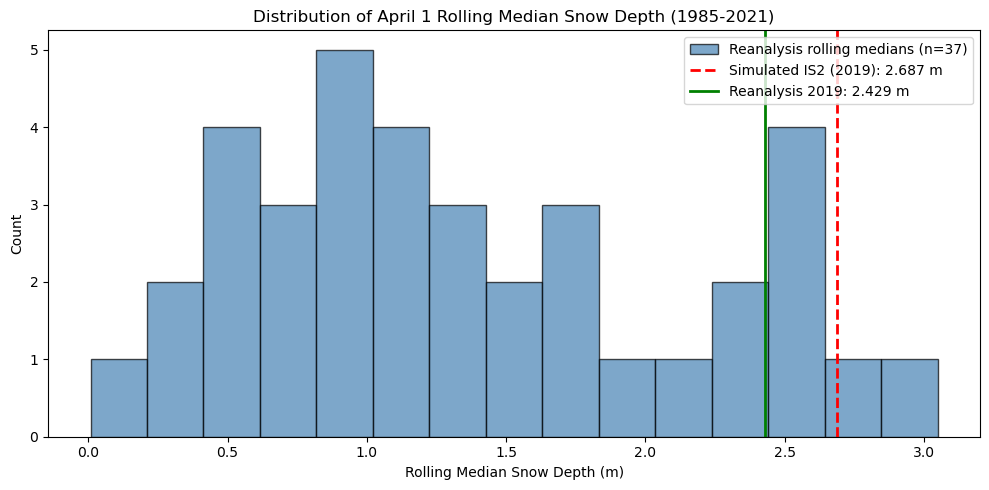


Simulated IS2 percentile rank: 94.6%
Reanalysis 2019 percentile rank: 81.1%


In [23]:
# Plot distribution of reanalysis rolling medians across years
import matplotlib.pyplot as plt

reanalysis_values = list(reanalysis_rolling_medians.values())
reanalysis_2019 = reanalysis_rolling_medians['wy_2019']

fig, ax = plt.subplots(figsize=(10, 5))

# Histogram of reanalysis rolling medians
ax.hist(reanalysis_values, bins=15, edgecolor='black', alpha=0.7, color='steelblue', 
        label=f'Reanalysis rolling medians (n={len(reanalysis_values)})')

# Vertical line for simulated ICESat-2 rolling median
ax.axvline(simulated_is2_rolling_median, color='red', linestyle='--', lw=2, 
           label=f'Simulated IS2 ({test_year}): {simulated_is2_rolling_median:.3f} m')

# Vertical line for reanalysis 2019
ax.axvline(reanalysis_2019, color='green', linestyle='-', lw=2,
           label=f'Reanalysis {test_year}: {reanalysis_2019:.3f} m')

ax.set_xlabel('Rolling Median Snow Depth (m)')
ax.set_ylabel('Count')
ax.set_title(f'Distribution of April 1 Rolling Median Snow Depth (1985-2021)')
ax.legend(loc='upper right')
plt.tight_layout()
plt.show()

# Print percentile ranks
percentile_is2 = (np.array(reanalysis_values) < simulated_is2_rolling_median).sum() / len(reanalysis_values) * 100
percentile_2019 = (np.array(reanalysis_values) < reanalysis_2019).sum() / len(reanalysis_values) * 100
print(f"\nSimulated IS2 percentile rank: {percentile_is2:.1f}%")
print(f"Reanalysis {test_year} percentile rank: {percentile_2019:.1f}%")

In [24]:
# Step 3: Build historical mean and std from reanalysis rolling medians (excluding 2019)
reanalysis_rolling_df = pd.DataFrame.from_dict(reanalysis_rolling_medians, orient='index', columns=['rolling_median'])
reanalysis_rolling_df.index = reanalysis_rolling_df.index.str.replace('wy_', '').astype(int)
reanalysis_rolling_df.index.name = 'water_year'

# Exclude 2019 for historical statistics
historical_values = reanalysis_rolling_df.loc[reanalysis_rolling_df.index != 2019, 'rolling_median']
historical_mean = historical_values.mean()
historical_std = historical_values.std()

print(f"Historical mean (excl. 2019): {historical_mean:.4f} m")
print(f"Historical std (excl. 2019): {historical_std:.4f} m")

Historical mean (excl. 2019): 1.3584 m
Historical std (excl. 2019): 0.7862 m


In [25]:
# Step 4: Calculate the SA of ICESat-2 rolling median vs historical mean/std
sim_is2_sa = (simulated_is2_rolling_median - historical_mean) / historical_std

print(f"ICESat-2 rolling median: {simulated_is2_rolling_median:.4f} m")
print(f"Standardized Anomaly: {sim_is2_sa:.4f}")

ICESat-2 rolling median: 2.6866 m
Standardized Anomaly: 1.6892


### Get long term statistics at reanalysis gridcells on april 1

In [26]:
# Step 5: Convert SA back to snow depth map and compare to real March 17 data

# Select March 17 of each year for mean/std calculation (excluding 2019)
sd_allyrs_april1 = swe_sca_ds_allyrs_roi.SD_Post.sel(
    time=((swe_sca_ds_allyrs_roi['time'].dt.month == 4) & (swe_sca_ds_allyrs_roi['time'].dt.day == 1))
)

In [27]:
sd_allyrs_april1_no2019 = sd_allyrs_april1.sel(time=sd_allyrs_april1['time'].dt.year != 2019)

In [28]:
sd_april1_mean = sd_allyrs_april1_no2019.mean(dim='time', skipna=True).compute()

/opt/homebrew/Caskroom/miniforge/base/envs/analog_mapping/lib/python3.12/site-packages/dask/array/numpy_compat.py:57: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/opt/homebrew/Caskroom/miniforge/base/envs/analog_mapping/lib/python3.12/site-packages/dask/array/numpy_compat.py:57: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/opt/homebrew/Caskroom/miniforge/base/envs/analog_mapping/lib/python3.12/site-packages/dask/array/numpy_compat.py:57: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/opt/homebrew/Caskroom/miniforge/base/envs/analog_mapping/lib/python3.12/site-packages/dask/array/numpy_compat.py:57: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/opt/homebrew/Caskroom/miniforge/base/envs/analog_mapping/lib/python3.12/site-packages/dask/array/numpy_compat.py:57: RuntimeWarning: invalid value encountered in divide
  x = np.divide(x1, x2, out)
/opt/

In [29]:
sd_april1_std = sd_allyrs_april1_no2019.std(dim='time', skipna=True).compute()

In [30]:
# Convert SA to snow depth: SD = SA * std + mean
sa_sd_estimated = (sim_is2_sa * sd_april1_std) + sd_april1_mean

In [31]:
# Get true reanalysis for March 17, 2019
true_sd_april1 = swe_sca_ds_allyrs_roi.SD_Post.sel(time='2019-03-17')

In [32]:
# Calculate difference
sa_sd_dif = (sa_sd_estimated - true_sd_april1).compute()

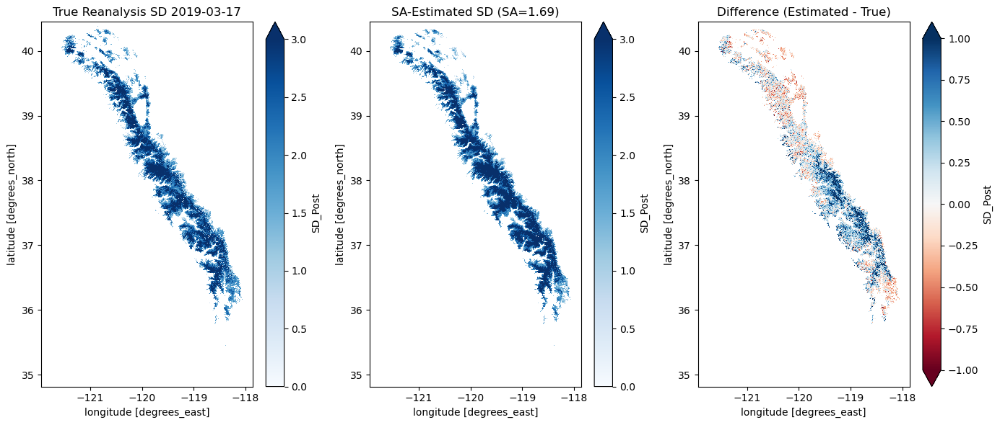

In [33]:

# Plot comparison
fig, ax = plt.subplots(1, 3, figsize=(14, 6))

true_sd_april1.plot(ax=ax[0], cmap='Blues', vmin=0, vmax=3)
ax[0].set_title('True Reanalysis SD 2019-03-17')

sa_sd_estimated.plot(ax=ax[1], cmap='Blues', vmin=0, vmax=3)
ax[1].set_title(f'SA-Estimated SD (SA={sim_is2_sa:.2f})')

sa_sd_dif.plot(ax=ax[2], cmap='RdBu', vmin=-1, vmax=1)
ax[2].set_title('Difference (Estimated - True)')

plt.tight_layout()

In [34]:
# Calculate metrics
true_sd = true_sd_april1.values.flatten()
pred_sd = sa_sd_estimated.values.flatten()

valid_mask = ~np.isnan(true_sd) & ~np.isnan(pred_sd)
true_sd_valid = true_sd[valid_mask]
pred_sd_valid = pred_sd[valid_mask]

bias = np.mean(pred_sd_valid - true_sd_valid)
rmse = np.sqrt(np.mean((pred_sd_valid - true_sd_valid)**2))
ss_res = np.sum((true_sd_valid - pred_sd_valid)**2)
ss_tot = np.sum((true_sd_valid - np.mean(true_sd_valid))**2)
r_squared = 1 - (ss_res / ss_tot)
pbias = 100 * np.sum(pred_sd_valid - true_sd_valid) / np.sum(true_sd_valid)

print(f"Metrics for Simulated SA-Estimated vs True Reanalysis SD (2019-04-01):")
print(f"  Bias:      {bias:.4f} m")
print(f"  RMSE:      {rmse:.4f} m")
print(f"  R²:        {r_squared:.4f}")
print(f"  PBIAS:     {pbias:.2f}%")
print(f"  N points:  {len(true_sd_valid)}")

Metrics for Simulated SA-Estimated vs True Reanalysis SD (2019-04-01):
  Bias:      0.2211 m
  RMSE:      0.5504 m
  R²:        0.6367
  PBIAS:     9.54%
  N points:  110501


## Run the SA method on all years of simulated data:

In [36]:
years = list(range(1985, 2022))
results = []
sa_sd_maps = {}

In [37]:
# Pre-compute April 1 snow depth for all years
print("Loading April 1 snow depth data...")
sd_allyrs_april1 = swe_sca_ds_allyrs_roi.SD_Post.sel(
    time=((swe_sca_ds_allyrs_roi['time'].dt.month == 4) & (swe_sca_ds_allyrs_roi['time'].dt.day == 1))
).compute()  # Load into memory once
print("Data loaded.")

Loading April 1 snow depth data...
Data loaded.


In [38]:
# Precompute leave-one-out mean and std for each test year
print("Precomputing leave-one-out statistics for all years...")
loo_stats = {}
for test_year in years:
    sd_excl = sd_allyrs_april1.sel(time=sd_allyrs_april1['time'].dt.year != test_year)
    loo_stats[test_year] = {
        'mean': sd_excl.mean(dim='time', skipna=True),
        'std': sd_excl.std(dim='time', skipna=True)
    }
    if test_year % 10 == 0:
        print(f"  Precomputed stats excluding {test_year}")
print("Precomputation complete.")

Precomputing leave-one-out statistics for all years...
  Precomputed stats excluding 1990
  Precomputed stats excluding 2000
  Precomputed stats excluding 2010
  Precomputed stats excluding 2020
Precomputation complete.


In [39]:
loo_stats

{1985: {'mean': <xarray.DataArray 'SD_Post' (y: 1267, x: 919)> Size: 5MB
  array([[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],
        shape=(1267, 919), dtype=float32)
  Coordinates:
    * y            (y) float32 5kB 34.82 34.82 34.83 34.83 ... 40.44 40.44 40.45
    * x            (x) float32 4kB -121.9 -121.9 -121.9 ... -117.9 -117.9 -117.9
      spatial_ref  int64 8B 0,
  'std': <xarray.DataArray 'SD_Post' (y: 1267, x: 919)> Size: 5MB
  array([[nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         ...,
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan],
         [nan, nan, nan, ..., nan, nan, nan]],
        shape=(1267, 919), dt

In [40]:
# Precompute reanalysis rolling medians (outside the loop)
wy_cols = [col for col in simulated_is2.columns if col.startswith('wy_')]
reanalysis_rolling_df = pd.DataFrame({
    'water_year': [int(col.replace('wy_', '')) for col in wy_cols],
    'rolling_median': [simulated_is2[col].median() for col in wy_cols]
}).set_index('water_year')

In [46]:
# Run SA method for all years 1985-2021 using leave-one-out approach
# OPTIMIZED: Precompute leave-one-out statistics before the loop

# Now run the main loop (much faster)
print("\nRunning SA calculations...")

results = []
sa_sd_maps = {}

for test_year in years:
    # Step 1: Get simulated ICESat-2 rolling median for test year
    sim_is2_median = simulated_is2[f'sim_is2_{test_year}'].median()
    
    # Step 2: Calculate historical mean/std excluding test year (from precomputed)
    historical_values = reanalysis_rolling_df.loc[
        reanalysis_rolling_df.index != test_year, 'rolling_median'
    ]
    historical_mean = historical_values.mean()
    historical_std = historical_values.std()
    
    # Step 3: Calculate standardized anomaly
    sim_is2_sa = (sim_is2_median - historical_mean) / historical_std
    
    # Step 4: Get precomputed gridded mean/std
    sd_mean = loo_stats[test_year]['mean']
    sd_std = loo_stats[test_year]['std']
    
    # Step 5: Convert SA to snow depth map
    sa_sd_estimated = (sim_is2_sa * sd_std) + sd_mean
    
    # Step 6: Get true reanalysis for April 1 of test year
    true_sd_april1 = sd_allyrs_april1.sel(
        time=sd_allyrs_april1['time'].dt.year == test_year
    ).squeeze()
    
    # Step 7: Calculate error statistics
    true_sd = true_sd_april1.values.flatten()
    pred_sd = sa_sd_estimated.values.flatten()
    
    valid_mask = ~np.isnan(true_sd) & ~np.isnan(pred_sd)
    true_sd_valid = true_sd[valid_mask]
    pred_sd_valid = pred_sd[valid_mask]
    
    if len(true_sd_valid) > 0:
        bias = np.mean(pred_sd_valid - true_sd_valid)
        rmse = np.sqrt(np.mean((pred_sd_valid - true_sd_valid)**2))
        mae = np.mean(np.abs(pred_sd_valid - true_sd_valid))
        pbias = 100 * np.sum(pred_sd_valid - true_sd_valid) / np.sum(true_sd_valid)
        corr = np.corrcoef(true_sd_valid, pred_sd_valid)[0, 1]
        r_squared = corr ** 2
    else:
        bias = rmse = mae = r_squared = pbias = corr = np.nan
    
    results.append({
        'year': test_year,
        'sim_is2_median': sim_is2_median,
        'sa': sim_is2_sa,
        'historical_mean': historical_mean,
        'historical_std': historical_std,
        'bias': bias,
        'rmse': rmse,
        'mae': mae,
        'r_squared': r_squared,
        'pbias': pbias,
        'correlation': corr,
        'n_valid': len(true_sd_valid)
    })
    
    sa_sd_maps[test_year] = sa_sd_estimated
    
    if test_year % 5 == 0:
        print(f"Processed year {test_year}")

results_df = pd.DataFrame(results)
print(f"\nCompleted SA calculations for {len(years)} years")
print(f"\nSummary statistics:")
print(results_df[['bias', 'rmse', 'mae', 'r_squared', 'pbias']].describe())


Running SA calculations...
Processed year 1985
Processed year 1990
Processed year 1995
Processed year 2000
Processed year 2005
Processed year 2010
Processed year 2015
Processed year 2020

Completed SA calculations for 37 years

Summary statistics:
            bias       rmse        mae  r_squared      pbias
count  37.000000  37.000000  37.000000  37.000000  37.000000
mean    0.025202   0.425593   0.327428   0.763036  -1.000341
std     0.207909   0.124740   0.100695   0.099048  21.651665
min    -0.406152   0.259199   0.180917   0.384245 -67.949563
25%    -0.118529   0.340894   0.259047   0.731423  -8.761540
50%     0.029217   0.380258   0.294109   0.759743   2.432412
75%     0.160548   0.486975   0.373679   0.837725  14.907208
max     0.420236   0.672892   0.544830   0.868960  32.905088


In [58]:
results_is2_df = pd.read_csv('../data/results/sa_real_is2_error_stats_april1.csv', index_col=0)

In [60]:
results_is2_df

,target_date,is2_rolling_median,sa,historical_mean,historical_std,bias,rmse,mae,r_squared,pbias,correlation,n_points,n_valid
year,,,,,,,,,,,,,
2019,2019-04-01,2.269993,1.250308,1.278530,0.792975,0.029054,0.452882,0.324544,0.793010,1.334843,0.890511,36245,110501
2020,2020-04-01,0.792774,-0.628226,1.291448,0.793781,-0.062270,0.306459,0.225258,0.789253,-7.161710,0.888399,37221,110501
2021,2021-04-01,0.507519,-1.002753,1.256048,0.746474,-0.214558,0.372509,0.287703,0.753881,-29.057509,0.868263,46473,110501


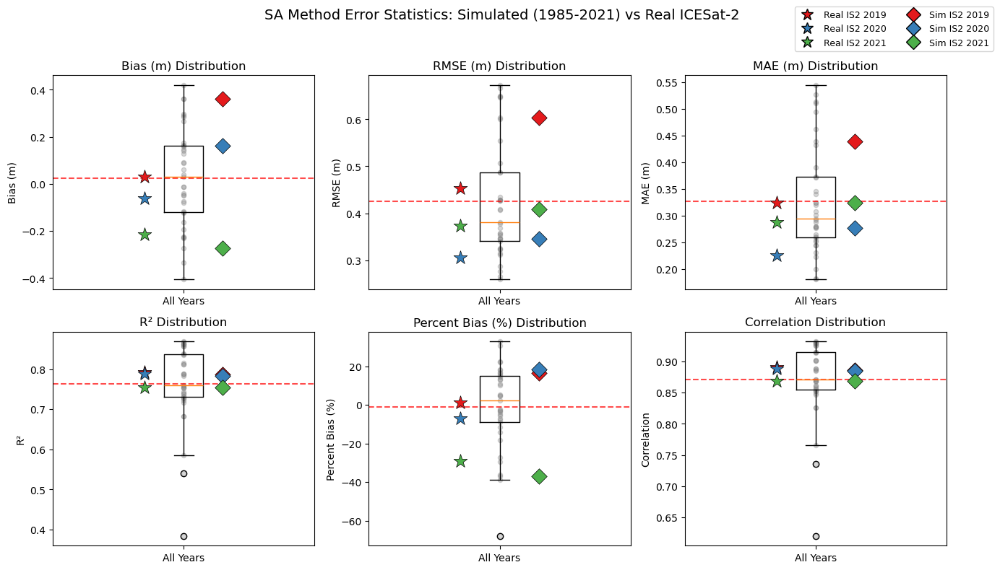


Simulated Error Statistics by Year:
 year      bias     rmse  r_squared      pbias
 1985 -0.406152 0.647721   0.717183 -27.201217
 1986  0.289798 0.647161   0.811923  15.896569
 1987  0.038601 0.347708   0.727659   4.859610
 1988 -0.162494 0.287100   0.743157 -36.065608
 1989 -0.073819 0.377458   0.814914  -6.910595
 1990 -0.222808 0.357221   0.721603 -38.749587
 1991 -0.227050 0.433903   0.737640 -13.958664
 1992 -0.335253 0.600898   0.541040 -29.625914
 1993  0.360313 0.666686   0.789136  13.233136
 1994  0.029217 0.277154   0.740408   4.482508
 1995 -0.118529 0.406554   0.868960  -4.678191
 1996  0.088116 0.428248   0.812557   5.329830
 1997 -0.116038 0.486975   0.864623  -8.761540
 1998  0.059392 0.486518   0.788740   2.432412
 1999  0.420236 0.672892   0.682207  30.714953
 2000 -0.231249 0.427305   0.752711 -18.411936
 2001  0.141121 0.346048   0.682352  22.463071
 2002  0.127128 0.324055   0.862406  10.901338
 2003  0.265225 0.352818   0.867661  32.905088
 2004 -0.124330 0.32566

In [64]:
# Plot boxplots of error statistics across all years
# Overlay real ICESat-2 metrics as colored points
fig, axes = plt.subplots(2, 3, figsize=(14, 8))
axes = axes.flatten()

metrics = ['bias', 'rmse', 'mae', 'r_squared', 'pbias', 'correlation']
titles = ['Bias (m)', 'RMSE (m)', 'MAE (m)', 'R²', 'Percent Bias (%)', 'Correlation']

# Color map for real ICESat-2 years
is2_colors = {2019: '#e41a1c', 2020: '#377eb8', 2021: '#4daf4a'}

for i, (metric, title) in enumerate(zip(metrics, titles)):
    ax = axes[i]
    ax.boxplot(results_df[metric].dropna(), vert=True)
    ax.scatter([1]*len(results_df), results_df[metric], alpha=0.3, s=20, color='gray', label='Simulated')
    ax.set_ylabel(title)
    ax.set_title(f'{title} Distribution')
    ax.set_xticklabels(['All Years'])
    
    # Add mean line
    mean_val = results_df[metric].mean()
    ax.axhline(mean_val, color='red', linestyle='--', alpha=0.7, label=f'Mean: {mean_val:.3f}')
    
    # Overlay real ICESat-2 metrics as colored points (offset left)
    for idx, row in results_is2_df.iterrows():
        yr = int(idx)  # year is the index
        if metric in row and not pd.isna(row[metric]):
            ax.scatter(0.85, row[metric], color=is2_colors[yr], s=200, marker='*', 
                       edgecolor='black', linewidth=0.5, zorder=5, label=f'Real IS2 {yr}' if i == 0 else '')
    
    # Overlay simulated ICESat-2 metrics for 2019-2021 (diamond markers, offset right)
    for yr in [2019, 2020, 2021]:
        sim_row = results_df[results_df['year'] == yr]
        if len(sim_row) > 0 and not pd.isna(sim_row[metric].values[0]):
            ax.scatter(1.15, sim_row[metric].values[0], color=is2_colors[yr], s=120, marker='D', 
                       edgecolor='black', linewidth=0.5, zorder=4)

# Create legend for real ICESat-2 years (only show once)
handles = [plt.Line2D([0], [0], marker='*', color='w', markerfacecolor=is2_colors[yr], 
                       markeredgecolor='black', markersize=12, label=f'Real IS2 {yr}') for yr in is2_colors]
handles += [plt.Line2D([0], [0], marker='D', color='w', markerfacecolor=is2_colors[yr], 
                        markeredgecolor='black', markersize=10, label=f'Sim IS2 {yr}') for yr in is2_colors]
fig.legend(handles=handles, loc='upper right', bbox_to_anchor=(0.99, 0.99), fontsize=9, ncol=2)

plt.suptitle('SA Method Error Statistics: Simulated (1985-2021) vs Real ICESat-2', fontsize=14)
plt.tight_layout(rect=[0, 0, 0.95, 0.95])
plt.show()

# Print summary table
print("\nSimulated Error Statistics by Year:")
print(results_df[['year', 'bias', 'rmse', 'r_squared', 'pbias']].to_string(index=False))
print("\nReal ICESat-2 Error Statistics:")
#print(results_is2_df[['year', 'bias', 'rmse', 'r_squared', 'pbias']].to_string(index=False))

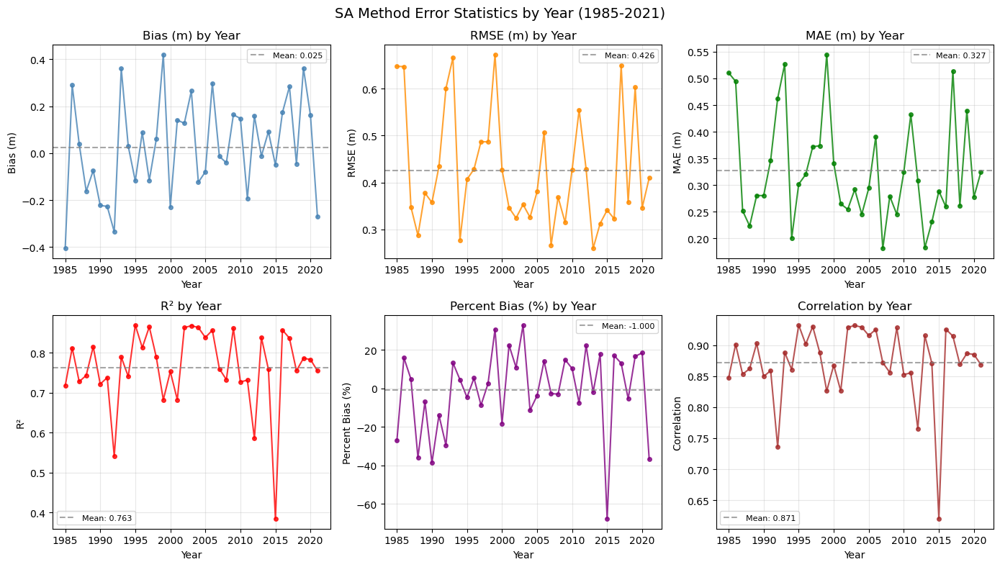

In [48]:
# Plot error statistics as time series by year
fig, axes = plt.subplots(2, 3, figsize=(14, 8))
axes = axes.flatten()

metrics = ['bias', 'rmse', 'mae', 'r_squared', 'pbias', 'correlation']
titles = ['Bias (m)', 'RMSE (m)', 'MAE (m)', 'R²', 'Percent Bias (%)', 'Correlation']
colors = ['steelblue', 'darkorange', 'green', 'red', 'purple', 'brown']

for i, (metric, title, color) in enumerate(zip(metrics, titles, colors)):
    ax = axes[i]
    ax.plot(results_df['year'], results_df[metric], marker='o', markersize=4, 
            color=color, linewidth=1.5, alpha=0.8)
    ax.axhline(results_df[metric].mean(), color='gray', linestyle='--', 
               alpha=0.7, label=f'Mean: {results_df[metric].mean():.3f}')
    ax.set_xlabel('Year')
    ax.set_ylabel(title)
    ax.set_title(f'{title} by Year')
    ax.legend(fontsize=8)
    ax.grid(True, alpha=0.3)

plt.suptitle('SA Method Error Statistics by Year (1985-2021)', fontsize=14)
plt.tight_layout()
plt.show()

In [49]:
# Identify notable years based on error statistics
notable_years = {}

# Bias
notable_years['largest_pos_bias'] = results_df.nlargest(5, 'bias')['year'].tolist()
notable_years['largest_neg_bias'] = results_df.nsmallest(5, 'bias')['year'].tolist()
notable_years['bias_closest_zero'] = results_df.iloc[(results_df['bias'].abs()).argsort()[:5]]['year'].tolist()

# RMSE
notable_years['largest_rmse'] = results_df.nlargest(5, 'rmse')['year'].tolist()
notable_years['smallest_rmse'] = results_df.nsmallest(5, 'rmse')['year'].tolist()

# MAE
notable_years['largest_mae'] = results_df.nlargest(5, 'mae')['year'].tolist()
notable_years['smallest_mae'] = results_df.nsmallest(5, 'mae')['year'].tolist()

# R²
notable_years['highest_r2'] = results_df.nlargest(5, 'r_squared')['year'].tolist()
notable_years['lowest_r2'] = results_df.nsmallest(5, 'r_squared')['year'].tolist()

# Percent Bias
notable_years['largest_pos_pbias'] = results_df.nlargest(5, 'pbias')['year'].tolist()
notable_years['largest_neg_pbias'] = results_df.nsmallest(5, 'pbias')['year'].tolist()
notable_years['pbias_closest_zero'] = results_df.iloc[(results_df['pbias'].abs()).argsort()[:5]]['year'].tolist()

# Print summary
print("Notable Years by Error Statistic:\n")
for key, yrs in notable_years.items():
    metric_vals = results_df[results_df['year'].isin(yrs)][['year', 'bias', 'rmse', 'mae', 'r_squared', 'pbias']]
    print(f"{key.replace('_', ' ').title()}:")
    for yr in yrs:
        row = results_df[results_df['year'] == yr].iloc[0]
        print(f"  {yr}: bias={row['bias']:.3f}, rmse={row['rmse']:.3f}, r²={row['r_squared']:.3f}, pbias={row['pbias']:.1f}%")
    print()

Notable Years by Error Statistic:

Largest Pos Bias:
  1999: bias=0.420, rmse=0.673, r²=0.682, pbias=30.7%
  2019: bias=0.362, rmse=0.603, r²=0.786, pbias=16.6%
  1993: bias=0.360, rmse=0.667, r²=0.789, pbias=13.2%
  2006: bias=0.297, rmse=0.507, r²=0.856, pbias=14.3%
  1986: bias=0.290, rmse=0.647, r²=0.812, pbias=15.9%

Largest Neg Bias:
  1985: bias=-0.406, rmse=0.648, r²=0.717, pbias=-27.2%
  1992: bias=-0.335, rmse=0.601, r²=0.541, pbias=-29.6%
  2021: bias=-0.272, rmse=0.409, r²=0.754, pbias=-36.8%
  2000: bias=-0.231, rmse=0.427, r²=0.753, pbias=-18.4%
  1991: bias=-0.227, rmse=0.434, r²=0.738, pbias=-14.0%

Bias Closest Zero:
  2013: bias=-0.012, rmse=0.259, r²=0.838, pbias=-2.1%
  2007: bias=-0.014, rmse=0.266, r²=0.760, pbias=-2.7%
  1994: bias=0.029, rmse=0.277, r²=0.740, pbias=4.5%
  1987: bias=0.039, rmse=0.348, r²=0.728, pbias=4.9%
  2008: bias=-0.041, rmse=0.369, r²=0.733, pbias=-3.0%

Largest Rmse:
  1999: bias=0.420, rmse=0.673, r²=0.682, pbias=30.7%
  1993: bias=0.360

In [50]:
# Visualize snow depth maps for notable years
def plot_notable_years(category_name, year_list, results_df, sa_sd_maps, sd_allyrs_april1):
    """Plot estimated vs true snow depth for a list of notable years"""
    n_years = len(year_list)
    fig, axes = plt.subplots(n_years, 3, figsize=(14, 4*n_years))
    if n_years == 1:
        axes = axes.reshape(1, -1)
    
    for i, yr in enumerate(year_list):
        row = results_df[results_df['year'] == yr].iloc[0]
        estimated = sa_sd_maps[yr]
        true_sd = sd_allyrs_april1.sel(time=sd_allyrs_april1['time'].dt.year == yr).squeeze()
        diff = estimated - true_sd
        
        # True SD
        true_sd.plot(ax=axes[i, 0], cmap='Blues', vmin=0, vmax=3, add_colorbar=True)
        axes[i, 0].set_title(f'{yr} True SD')
        
        # Estimated SD
        estimated.plot(ax=axes[i, 1], cmap='Blues', vmin=0, vmax=3, add_colorbar=True)
        axes[i, 1].set_title(f'{yr} Estimated SD (SA={row["sa"]:.2f})')
        
        # Difference
        diff.plot(ax=axes[i, 2], cmap='RdBu', vmin=-1, vmax=1, add_colorbar=True)
        axes[i, 2].set_title(f'{yr} Diff (Bias={row["bias"]:.2f}, RMSE={row["rmse"]:.2f})')
    
    plt.suptitle(f'{category_name}', fontsize=14, y=1.01)
    plt.tight_layout()
    plt.show()

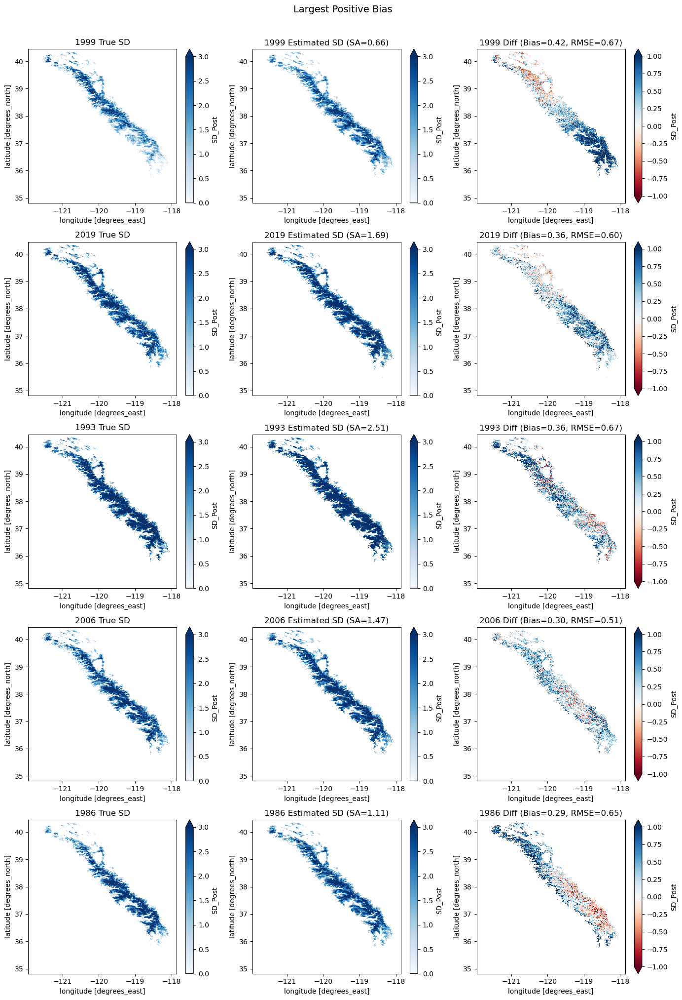

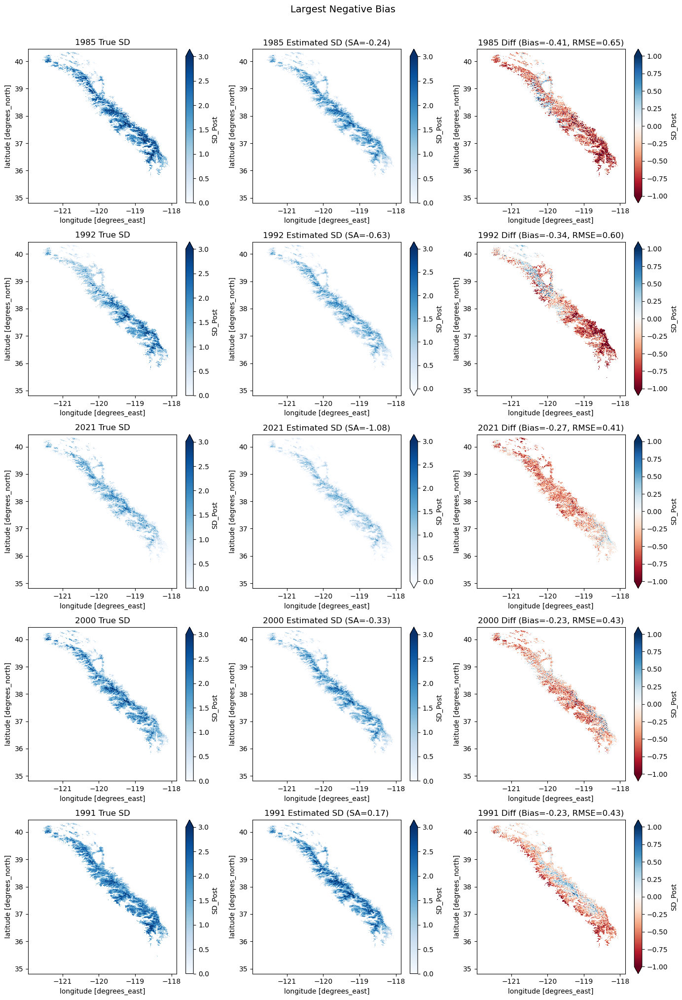

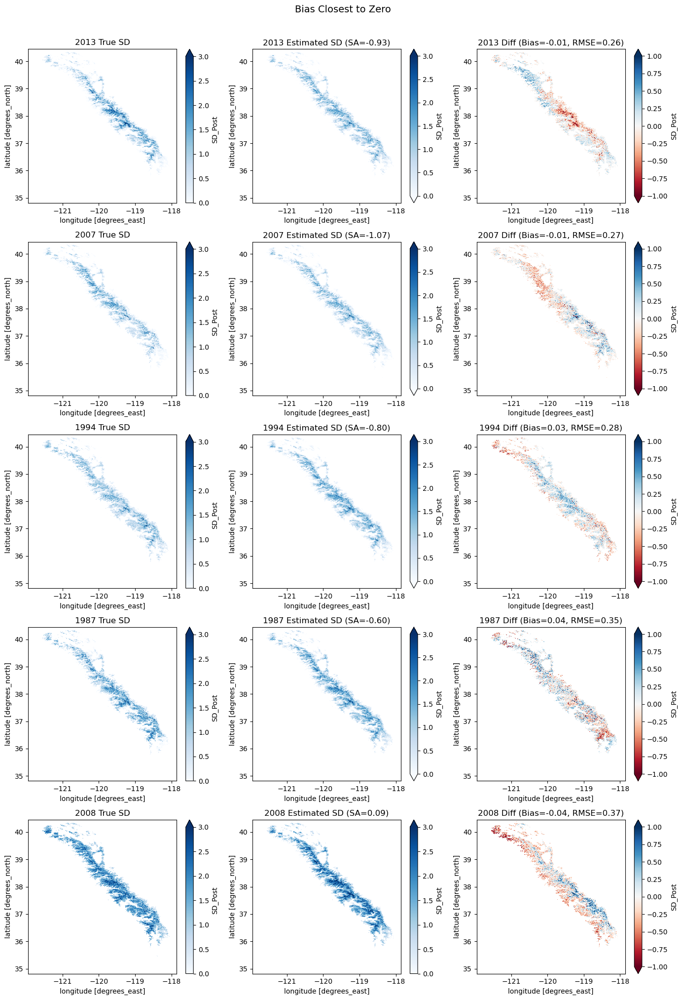

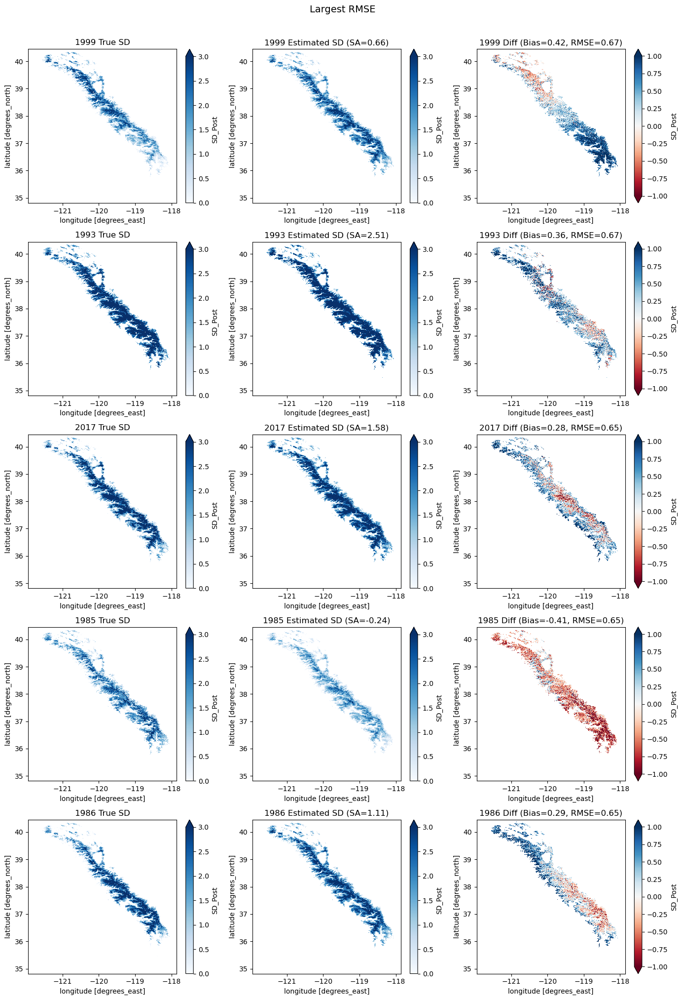

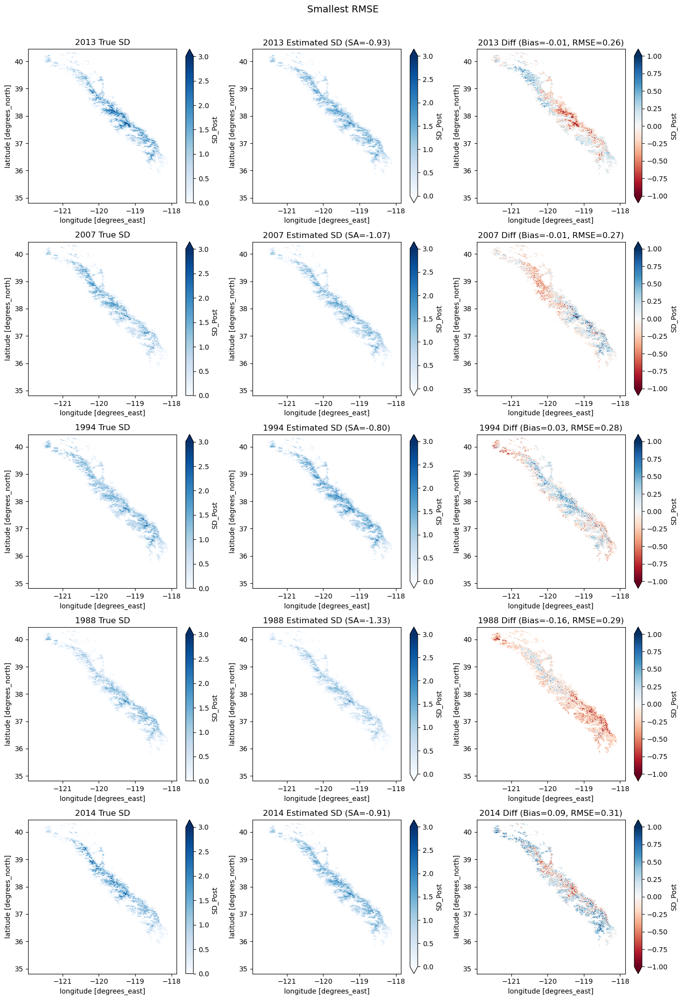

...

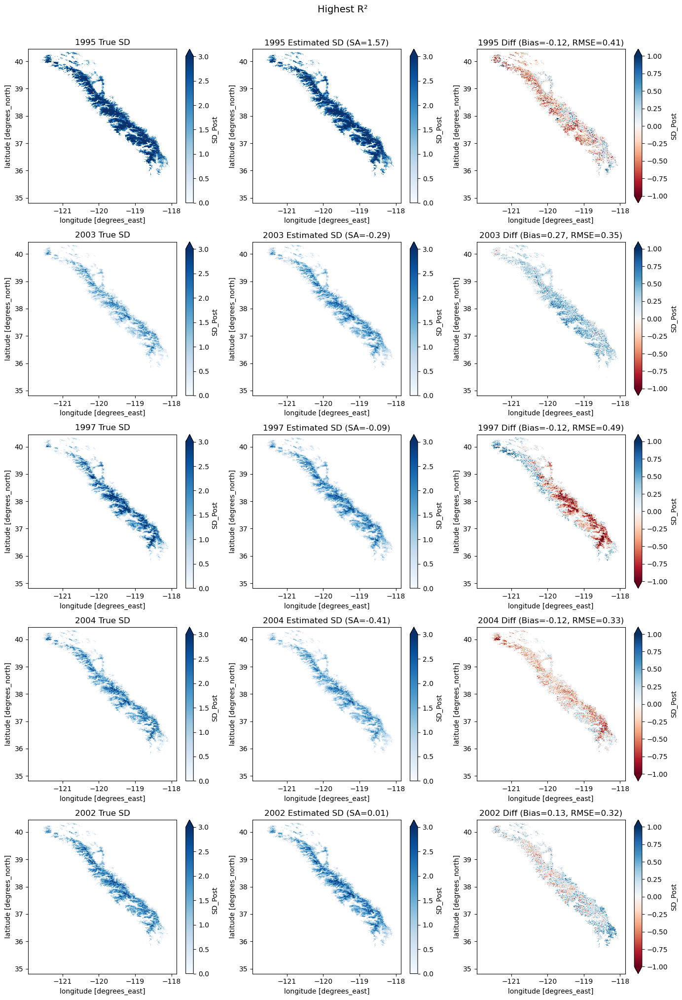

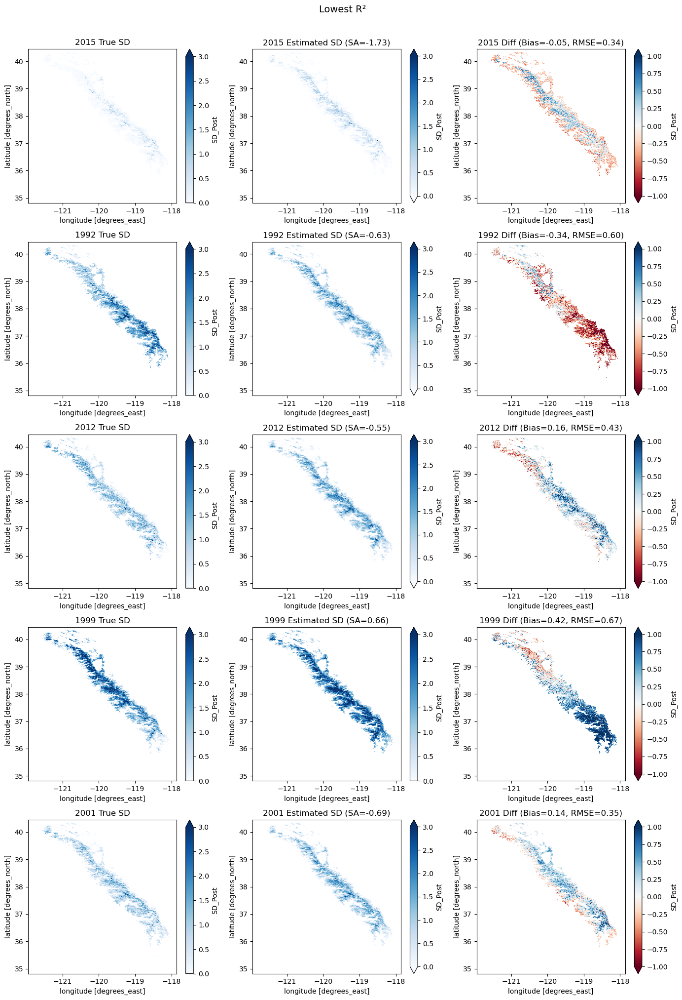

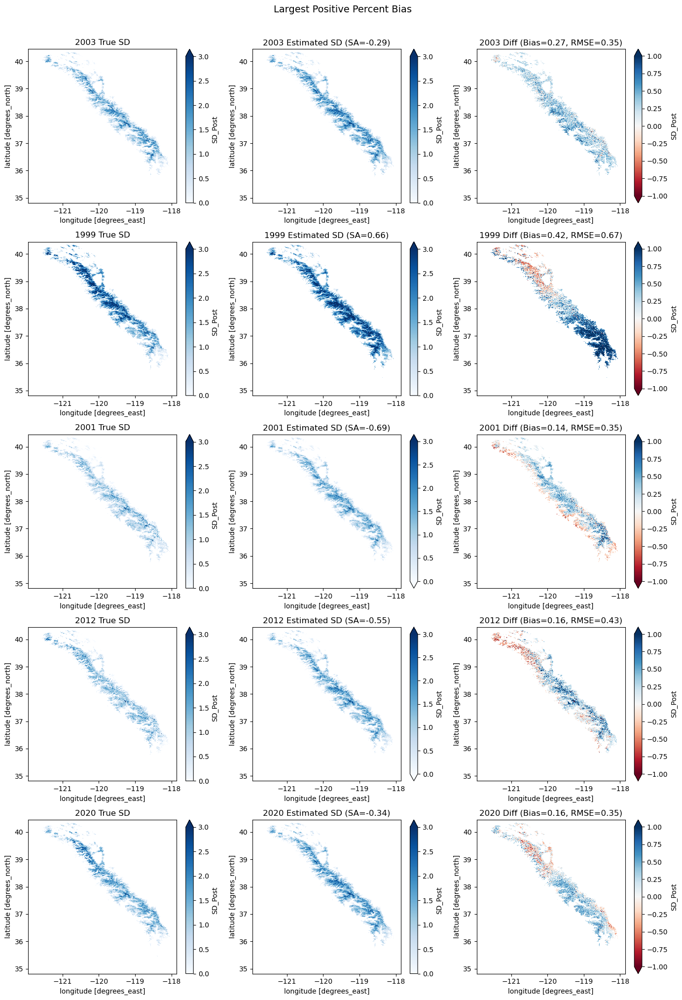

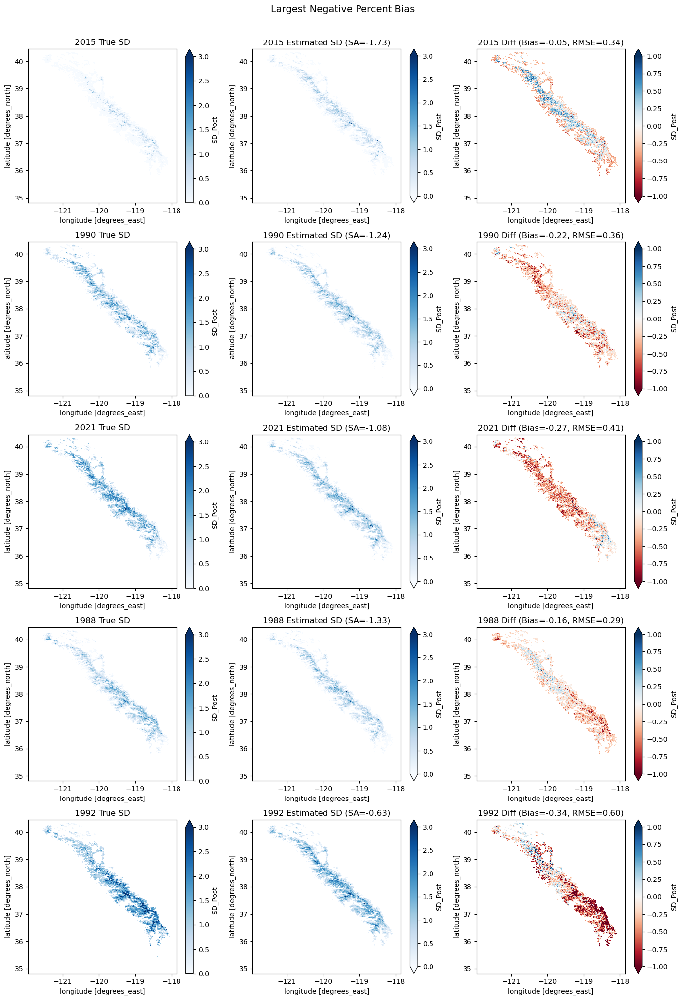

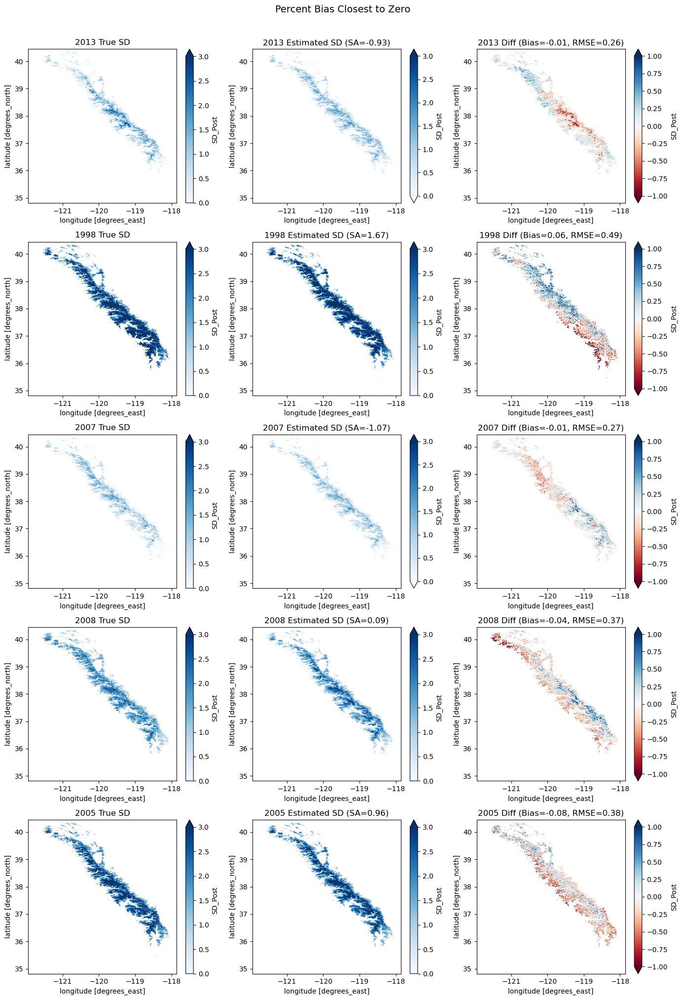

In [51]:
# Plot all categories of notable years
categories_to_plot = [
    ('Largest Positive Bias', notable_years['largest_pos_bias']),
    ('Largest Negative Bias', notable_years['largest_neg_bias']),
    ('Bias Closest to Zero', notable_years['bias_closest_zero']),
    ('Largest RMSE', notable_years['largest_rmse']),
    ('Smallest RMSE', notable_years['smallest_rmse']),
    ('Largest MAE', notable_years['largest_mae']),
    ('Smallest MAE', notable_years['smallest_mae']),
    ('Highest R²', notable_years['highest_r2']),
    ('Lowest R²', notable_years['lowest_r2']),
    ('Largest Positive Percent Bias', notable_years['largest_pos_pbias']),
    ('Largest Negative Percent Bias', notable_years['largest_neg_pbias']),
    ('Percent Bias Closest to Zero', notable_years['pbias_closest_zero']),
]

for category_name, year_list in categories_to_plot:
    plot_notable_years(category_name, year_list, results_df, sa_sd_maps, sd_allyrs_april1)

In [54]:
# Save results
results_df.to_csv('../data/results/sa_simulated_is2_error_stats_allyrs.csv', index=False)

# Save snow depth maps as xarray dataset
sa_sd_ds = xr.concat(
    [sa_sd_maps[yr].expand_dims(year=[yr]) for yr in years],
    dim='year'
)
sa_sd_ds.name = 'sa_estimated_sd'
sa_sd_ds.to_netcdf('../data/results/sa_simulated_is2_sd_maps_allyrs.nc')

print(f"Saved error statistics to '../data/results/sa_simulated_is2_error_stats_allyrs.csv'")
print(f"Saved snow depth maps to '../data/results/sa_simulated_is2_sd_maps_allyrs.nc'")

Saved error statistics to '../data/results/sa_simulated_is2_error_stats_allyrs.csv'
Saved snow depth maps to '../data/results/sa_simulated_is2_sd_maps_allyrs.nc'
